# In silico gene perturbation with GRNs

In [1]:
import os
import sys

import matplotlib.colors as colors
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns

In [2]:
import celloracle as co
co.__version__

'0.10.14'

In [3]:
#plt.rcParams["font.family"] = "arial"
plt.rcParams["figure.figsize"] = [6,6]
%config InlineBackend.figure_format = 'retina'
plt.rcParams["savefig.dpi"] = 600

%matplotlib inline

In [4]:
# Make folder to save plots
save_folder = "figures"
os.makedirs(save_folder, exist_ok=True)

## 1. Load the data

In [5]:
# Load the processed oracle object. 
oracle = co.load_hdf5("woundcell.celloracle.oracle")
oracle

Oracle object

Meta data
    celloracle version used for instantiation: 0.10.14
    n_cells: 10064
    n_genes: 3000
    cluster_name: upCellTypes
    dimensional_reduction_name: X_umap
    n_target_genes_in_TFdict: 27314 genes
    n_regulatory_in_TFdict: 1094 genes
    n_regulatory_in_both_TFdict_and_scRNA-seq: 143 genes
    n_target_genes_both_TFdict_and_scRNA-seq: 2792 genes
    k_for_knn_imputation: 251
Status
    Gene expression matrix: Ready
    BaseGRN: Ready
    PCA calculation: Done
    Knn imputation: Done
    GRN calculation for simulation: Not finished

In [6]:
# Load the inferred GRNs
links = co.load_hdf5(file_path="woundcells.celloracle.links")

In [7]:
links

## 2. Make predictive models for simulation

Here, we will need to fit the ridge regression models again. This process will take less time than the GRN inference in the previous notebook, because we are using the filtered GRN models.

In [8]:
links.filter_links()
oracle.get_cluster_specific_TFdict_from_Links(links_object=links)
oracle.fit_GRN_for_simulation(alpha=10, 
                              use_cluster_specific_TFdict=True)

  0%|          | 0/9 [00:00<?, ?it/s]

## 3. In silico TF perturbation analysis

### 3.1. Check gene expression pattern.

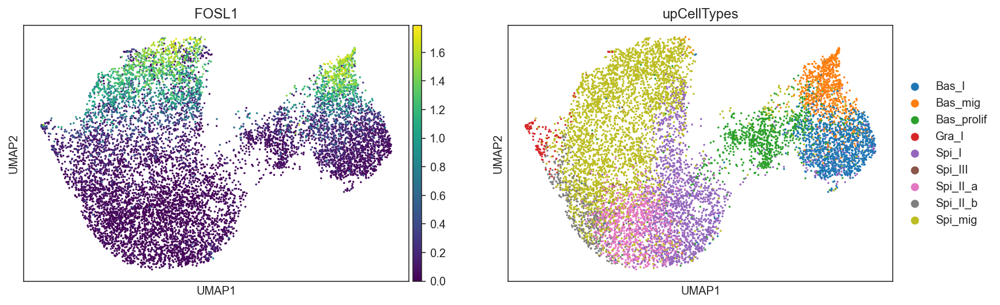

In [9]:
# Check gene expression (FOSL1)
goi = "FOSL1"
sc.pl.umap(oracle.adata, color=[goi, oracle.cluster_column_name],
                 layer="imputed_count", use_raw=False, cmap="viridis")

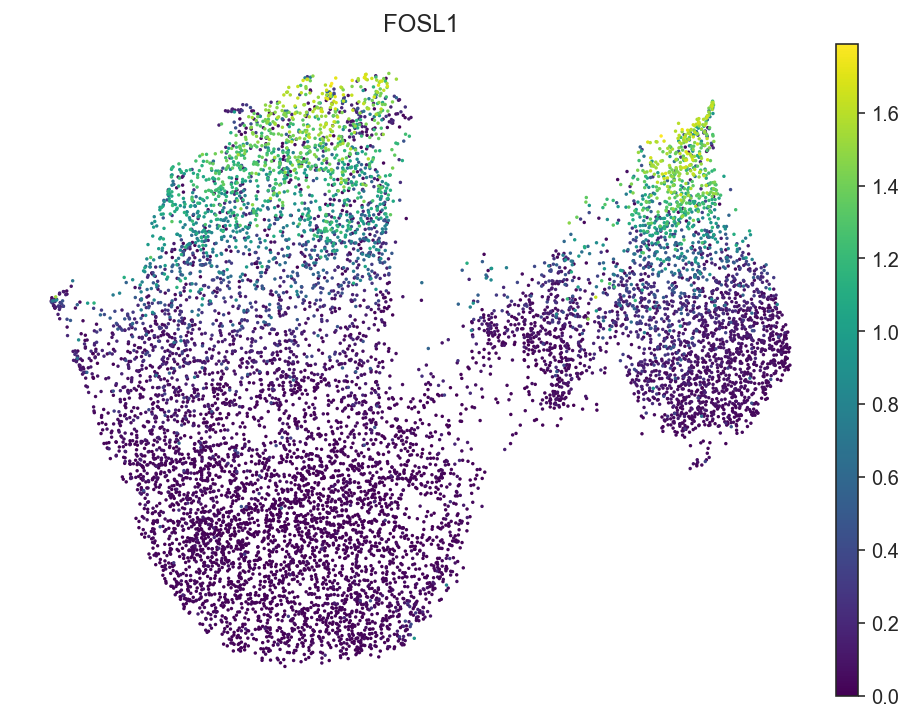

In [17]:
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (8, 6)}):
    sc.pl.umap(oracle.adata, color=[goi],
                 layer="imputed_count", use_raw=False, cmap="viridis", frameon=False,
              save="Fig3_TFregulon_FOSL1_OE_woundcell_NEW_exp.pdf")

In [11]:
oracle.adata

AnnData object with n_obs × n_vars = 10064 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Patient', 'Gender', 'Age', 'Condition', 'seurat_clusters', 'upCellTypes', 'monocle3_pseudotime', 'UMAP_1', 'UMAP_2', 'barcode'
    var: 'features', 'symbol', 'isin_top1000_var_mean_genes', 'isin_TFdict_targets', 'isin_TFdict_regulators', 'isin_actve_regulators'
    uns: 'upCellTypes_colors', 'Condition_colors', 'log1p'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    layers: 'raw_count', 'normalized_count', 'imputed_count', 'simulation_input'

In [12]:
colors_proto  = np.array(['#807dba','#9e9ac8','#ccebc5','#fccde5',
               '#fe9929','#fec44f','#fee391',
               '#fb8072','#b3de69'])
oracle.adata.uns['CellTypes_colors'] = colors_proto

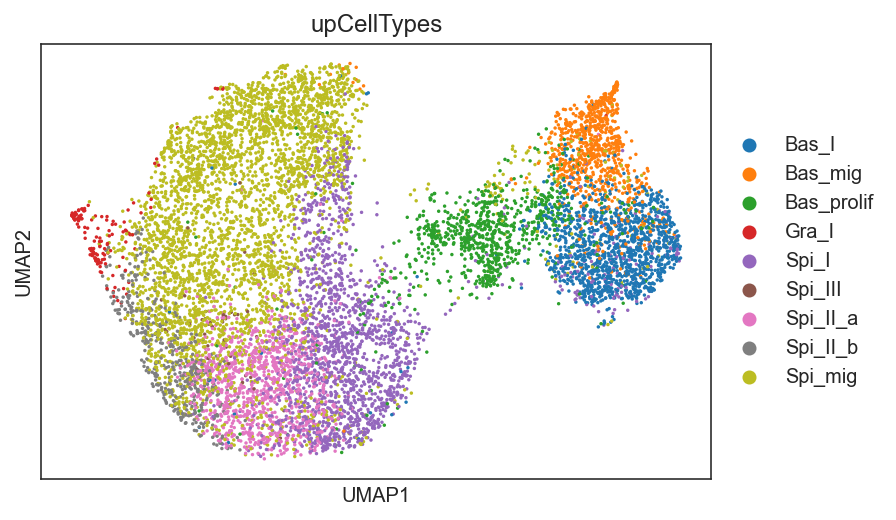

In [13]:
sc.pl.umap(oracle.adata, color=[oracle.cluster_column_name],
                 layer="imputed_count", use_raw=False, cmap="viridis")

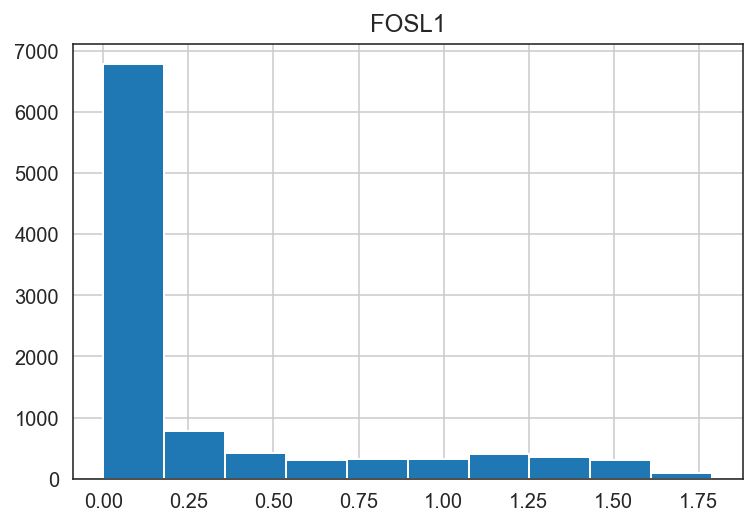

In [14]:
# Plot gene expression in histogram
sc.get.obs_df(oracle.adata, keys=[goi], layer="imputed_count").hist()
plt.show()

### 3.2. Calculate future gene expression after perturbation.

You can use any gene expression value in the in silico perturbations, but please avoid extremely high values that are far from the natural gene expression range. The upper limit allowed is twice the maximum gene expression.

To simulate FOSL1 OE, we will set FOSL1 expression to 2.

In [15]:
# Enter perturbation conditions to simulate signal propagation after the perturbation.
oracle.simulate_shift(perturb_condition={goi: 2},
                      n_propagation=3)

### 3.3. Calculate transition probability between cells

The steps above simulated tge global future gene expression shift after perturbation. This prediction is based on iterative calculations of signal propagation calculations within the GRN. Please look at our paper for more information.

The next step calculates the probability of cell state transitions based on the simulation data. You can use the transition probabilities between cells to predict how cells will change after a perturbation.

This transition probability will be used later.

In [16]:
# Get transition probability
oracle.estimate_transition_prob(n_neighbors=200,
                                knn_random=True, 
                                sampled_fraction=1)

# Calculate embedding 
oracle.calculate_embedding_shift(sigma_corr=0.05)

## 4. Visualization

### 4.1. Quiver plot: Show the direction of cell transition at single cell resolution

Caution: It is very important to find the optimal scale parameter.

We will need to adjust the scale parameter. Please seek to find the optimal scale parameter for the data based on your data.

If the vectors are not visible, you can try a smaller scale parameter to magnify the vector length. However, if you see large vectors in the randomized results (right panel), it means that the scale parameter is too small.

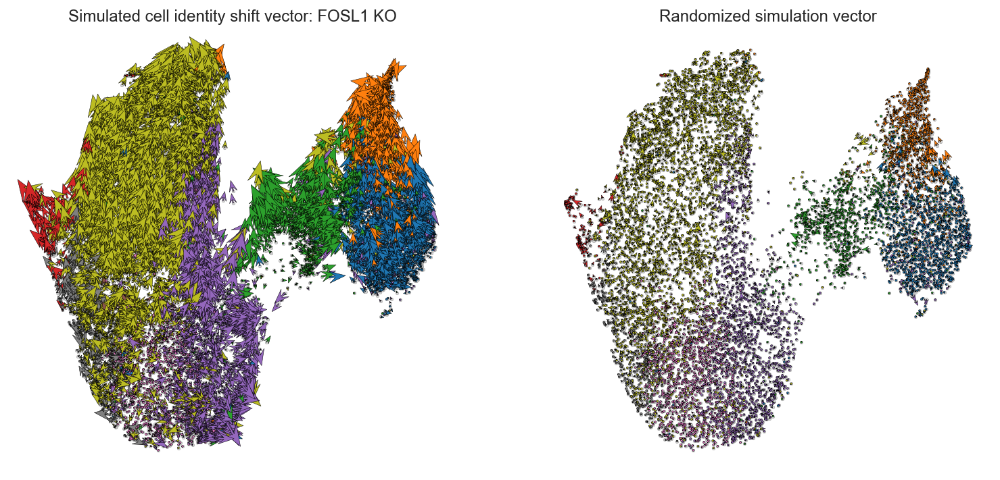

In [17]:
fig, ax = plt.subplots(1, 2,  figsize=[13, 6])

scale = 25
# Show quiver plot
oracle.plot_quiver(scale=scale, ax=ax[0])
ax[0].set_title(f"Simulated cell identity shift vector: {goi} KO")

# Show quiver plot that was calculated with randomized graph.
oracle.plot_quiver_random(scale=scale, ax=ax[1])
ax[1].set_title(f"Randomized simulation vector")

plt.show()

### 4.2. Vector field graph

We will visualize the simulation results as a vector field on a digitized grid. Single cell transition vectors are grouped by grid point.

#### 4.2.1 Find parameters for n_grid and min_mass

n_grid: Number of grid points.

min_mass: Threshold value for the cell density. The appropriate values for these parameters depends on the data. Please find appropriate values using the helper functions below.

In [18]:
# n_grid = 40 is a good starting value.
n_grid = 40 
oracle.calculate_p_mass(smooth=0.8, n_grid=n_grid, n_neighbors=200)

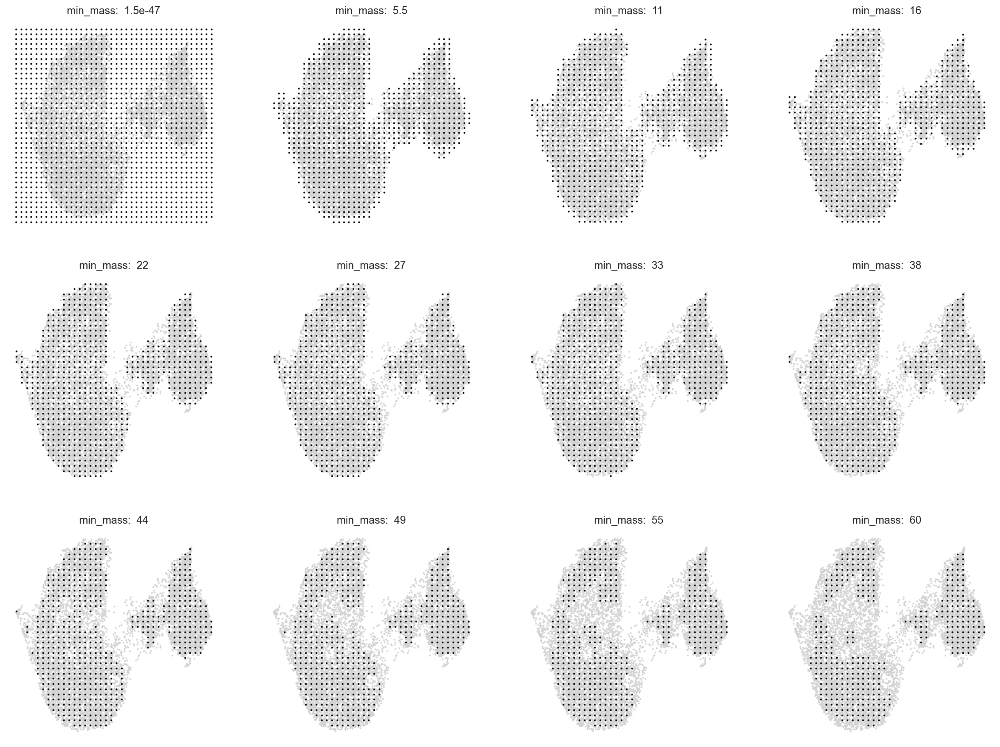

In [19]:
# Search for best min_mass.
oracle.suggest_mass_thresholds(n_suggestion=12)

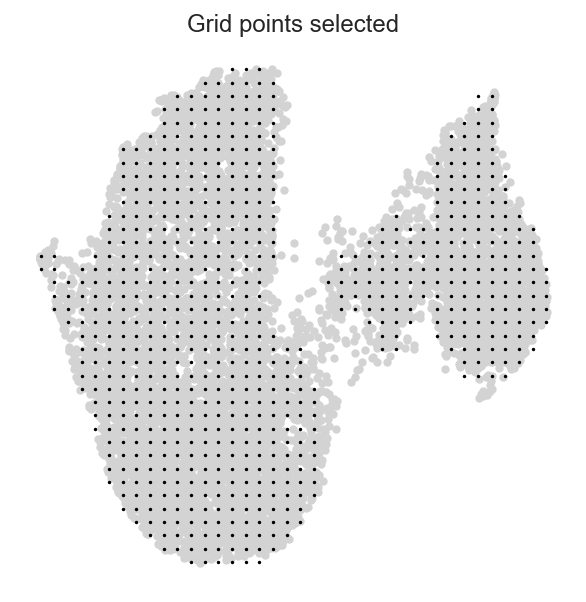

In [22]:
# According to the above results, set the min_mass value
min_mass = 27 
oracle.calculate_mass_filter(min_mass=min_mass, plot=True) 

In [23]:
?oracle.calculate_mass_filter

### 4.2.2 Plot vector fields

Again, we need to adjust the scale parameter. Please seek to find the optimal scale parameter that provides good visualization.

If you don't see any vector, you can try the smaller scale parameter to magnify the vector length. However, if you see large vectors in the randomized results (right panel), it means the scale parameter is too small.

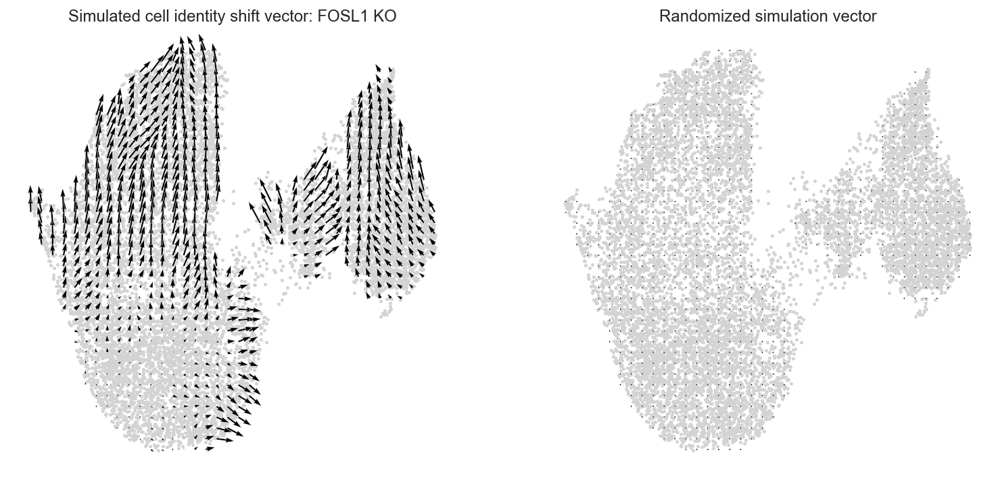

In [26]:
fig, ax = plt.subplots(1, 2,  figsize=[13, 6])

scale_simulation = 15
# Show quiver plot
oracle.plot_simulation_flow_on_grid(scale=scale_simulation, ax=ax[0])
ax[0].set_title(f"Simulated cell identity shift vector: {goi} KO")

# Show quiver plot that was calculated with randomized graph.
oracle.plot_simulation_flow_random_on_grid(scale=scale_simulation, ax=ax[1])
ax[1].set_title(f"Randomized simulation vector")

plt.show()

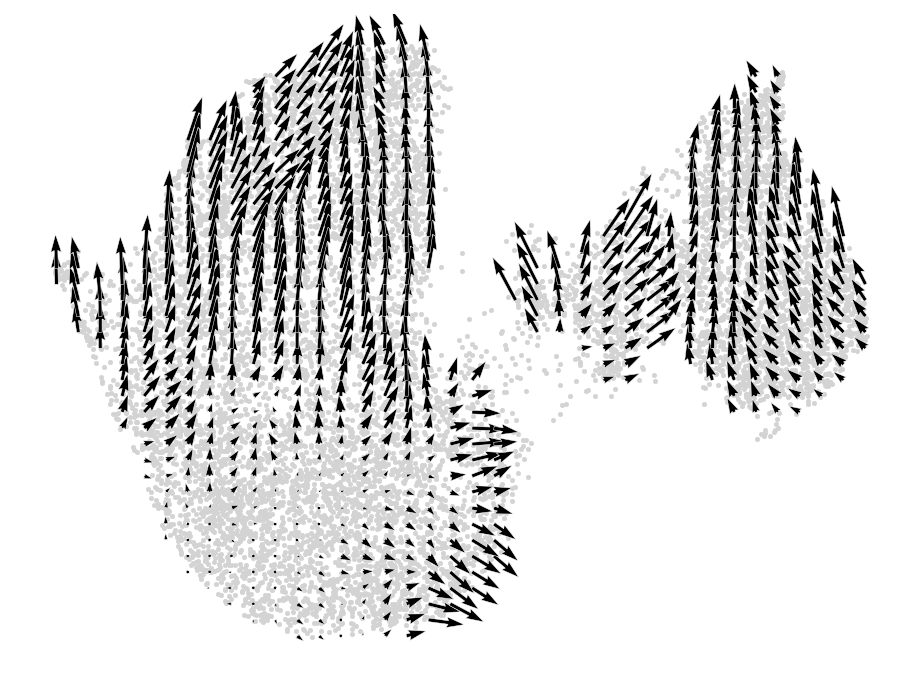

In [32]:
# Plot vector field with cell cluster 
fig, ax = plt.subplots(figsize=[8, 6])
oracle.plot_simulation_flow_on_grid(scale=15)

In [33]:
fig.savefig("Fig3_TFregulon_FOSL1_OE_woundcell_NEW22.pdf", bbox_inches='tight')

In [27]:
color_custom = {'Bas_I': '#807dba', 'Bas_II': '#9e9ac8', 'Bas_III': '#ccebc5',
                'Spi_I': '#fe9929', 'Spi_II': '#fec44f', 'Spi_III': '#fee391',
                'Spi_IV': '#fb8072', 'Spi_V': '#b3de69', 'Gra_I': '#fccde5'}

pal=[color for name, color in color_custom.items()]

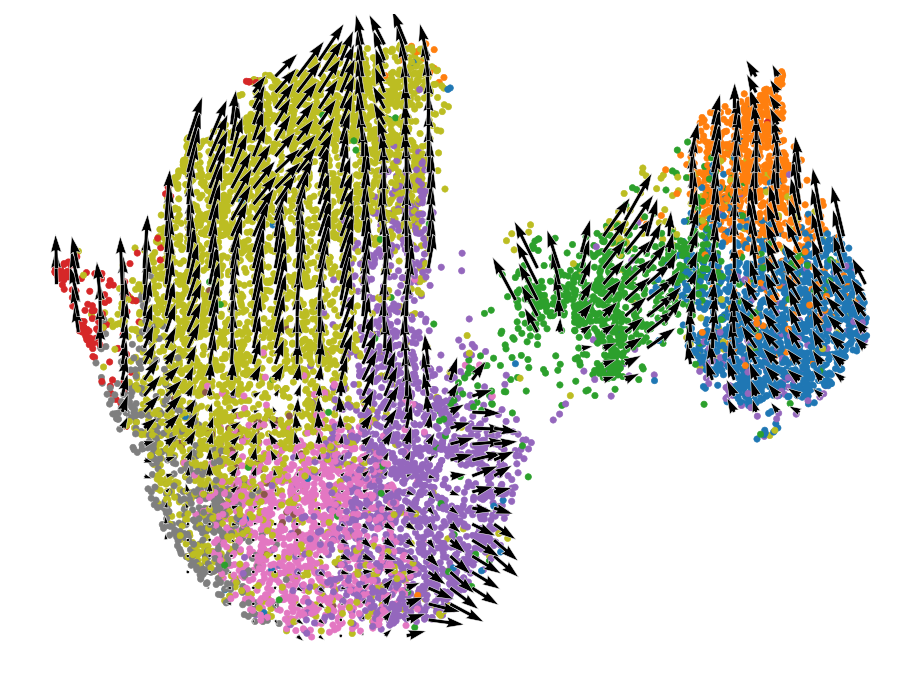

In [28]:
# Plot vector field with cell cluster 
fig, ax = plt.subplots(figsize=[8, 6])

oracle.plot_cluster_whole(ax=ax, s=10)
oracle.plot_simulation_flow_on_grid(scale=scale_simulation, ax=ax, show_background=False)

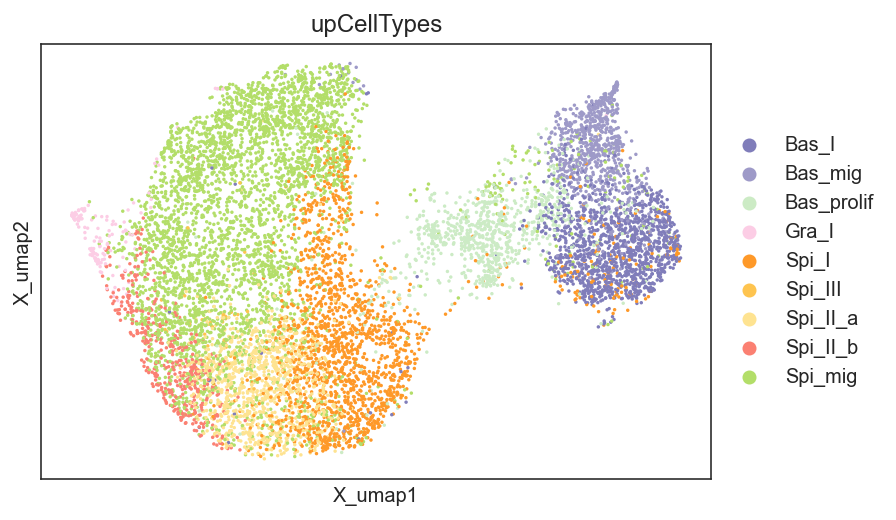

In [34]:
# Create an array with the colors you want to use
colors = ['#807dba','#9e9ac8','#ccebc5','#fccde5','#fe9929','#fec44f','#fee391','#fb8072','#b3de69']
# Set your custom color palette
oracle.update_cluster_colors(palette=sns.color_palette(colors))

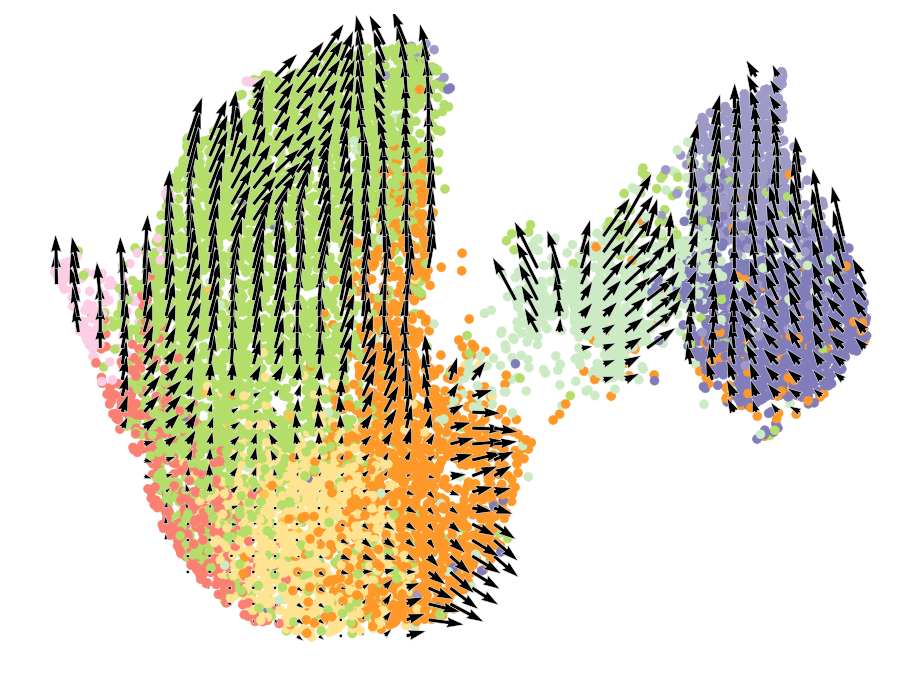

In [35]:
# Plot vector field with cell cluster 
fig, ax = plt.subplots(figsize=[8, 6])

oracle.plot_cluster_whole(ax=ax, s=20)
oracle.plot_simulation_flow_on_grid(scale=15, ax=ax, show_background=False)

In [36]:
fig.savefig("Fig3_TFregulon_FOSL1_OE_Woundcell_NEW.pdf", bbox_inches='tight')

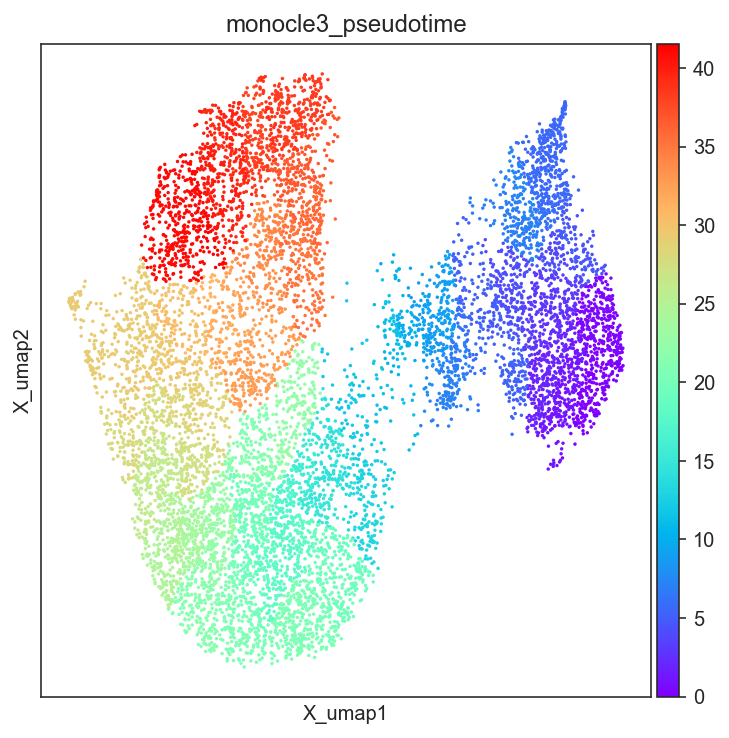

In [37]:
# Visualize pseudotime
fig, ax = plt.subplots(figsize=[6,6])

sc.pl.embedding(adata=oracle.adata, basis=oracle.embedding_name, ax=ax, cmap="rainbow",
                color=["monocle3_pseudotime"])

In [38]:
from celloracle.applications import Gradient_calculator

# Instantiate Gradient calculator object
gradient = Gradient_calculator(oracle_object=oracle, pseudotime_key="monocle3_pseudotime")

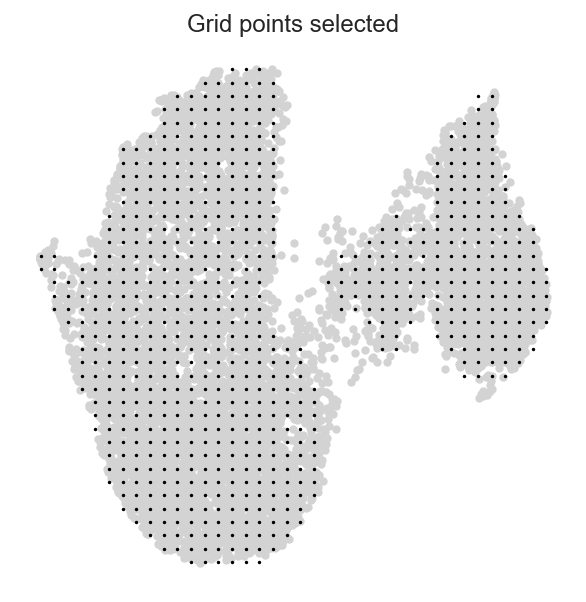

In [39]:
gradient.calculate_p_mass(smooth=0.8, n_grid=n_grid, n_neighbors=200)
gradient.calculate_mass_filter(min_mass=min_mass, plot=True)

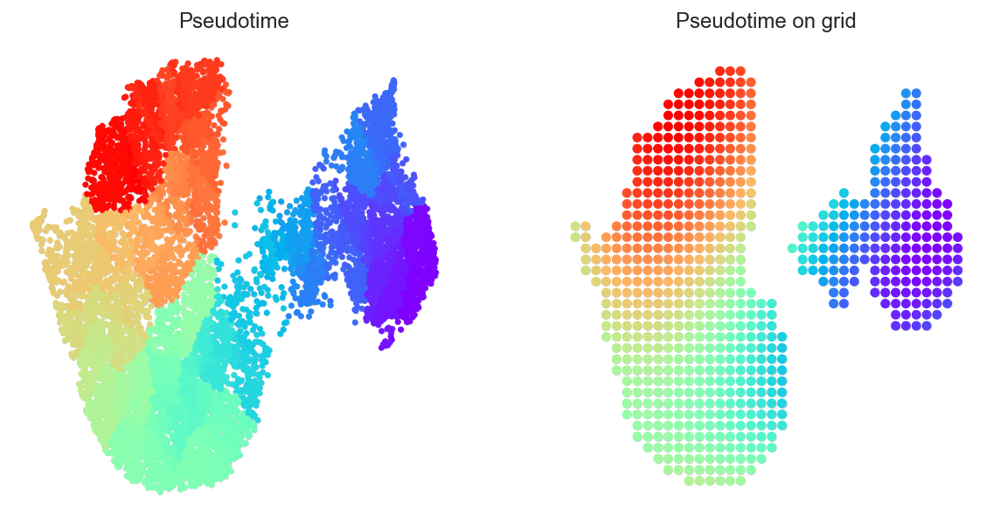

In [40]:
gradient.transfer_data_into_grid(args={"method": "polynomial", "n_poly":3}, plot=True)

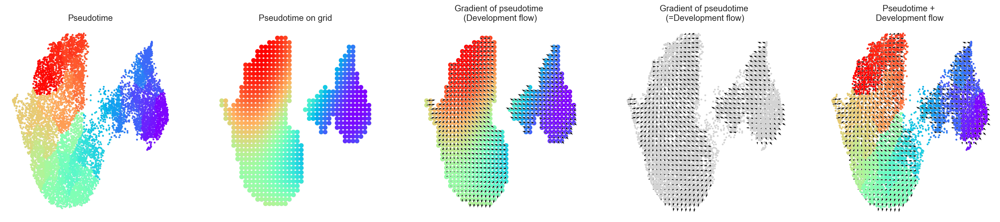

In [41]:
# Calculate graddient
gradient.calculate_gradient()

# Show results
scale_dev = 40
gradient.visualize_results(scale=scale_dev, s=5)

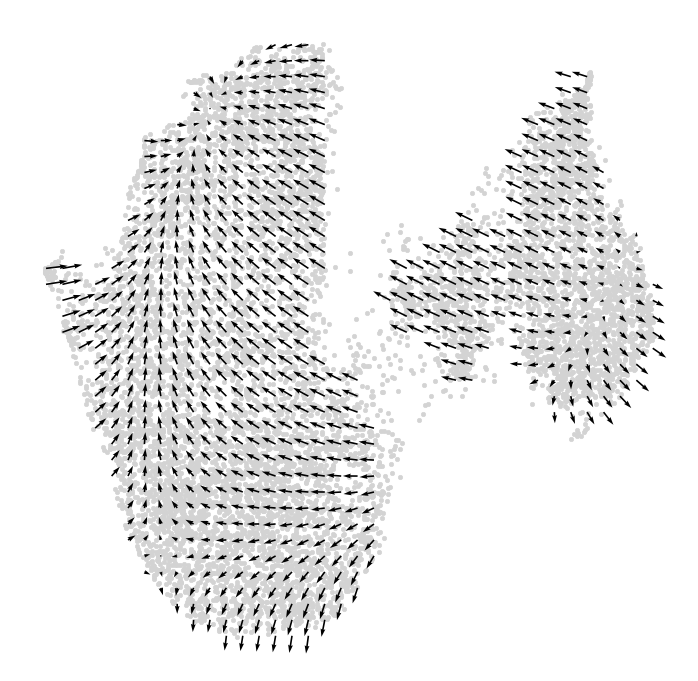

In [42]:
# Visualize results
fig, ax = plt.subplots(figsize=[6, 6])
gradient.plot_dev_flow_on_grid(scale=scale_dev, ax=ax)

In [43]:
from celloracle.applications import Oracle_development_module

# Make Oracle_development_module to compare two vector field
dev = Oracle_development_module()

# Load development flow
dev.load_differentiation_reference_data(gradient_object=gradient)

# Load simulation result
dev.load_perturb_simulation_data(oracle_object=oracle)


# Calculate inner produc scores
dev.calculate_inner_product()
dev.calculate_digitized_ip(n_bins=10)

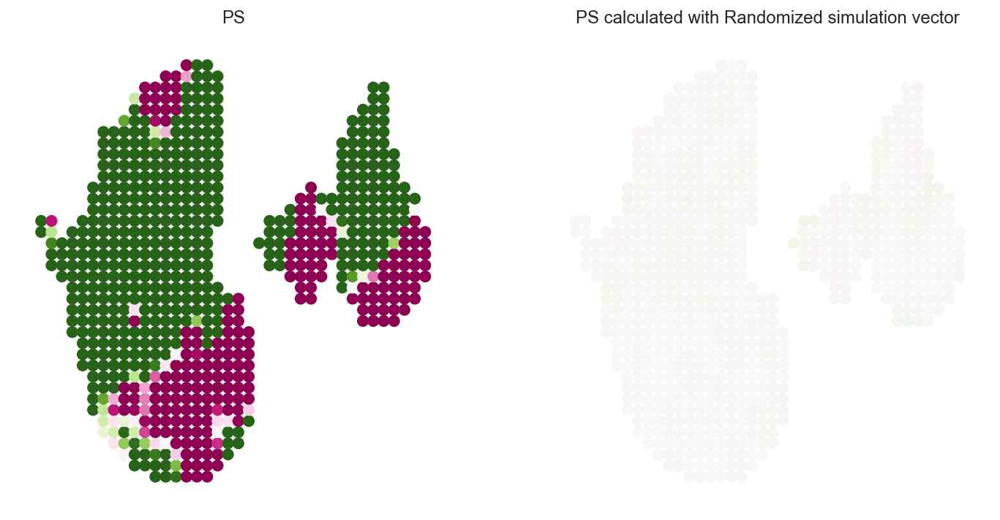

In [44]:
# Show perturbation scores
vm = 0.5

fig, ax = plt.subplots(1, 2, figsize=[12, 6])
dev.plot_inner_product_on_grid(vm=0.02, s=50, ax=ax[0])
ax[0].set_title(f"PS")

dev.plot_inner_product_random_on_grid(vm=vm, s=50, ax=ax[1])
ax[1].set_title(f"PS calculated with Randomized simulation vector")
plt.show()

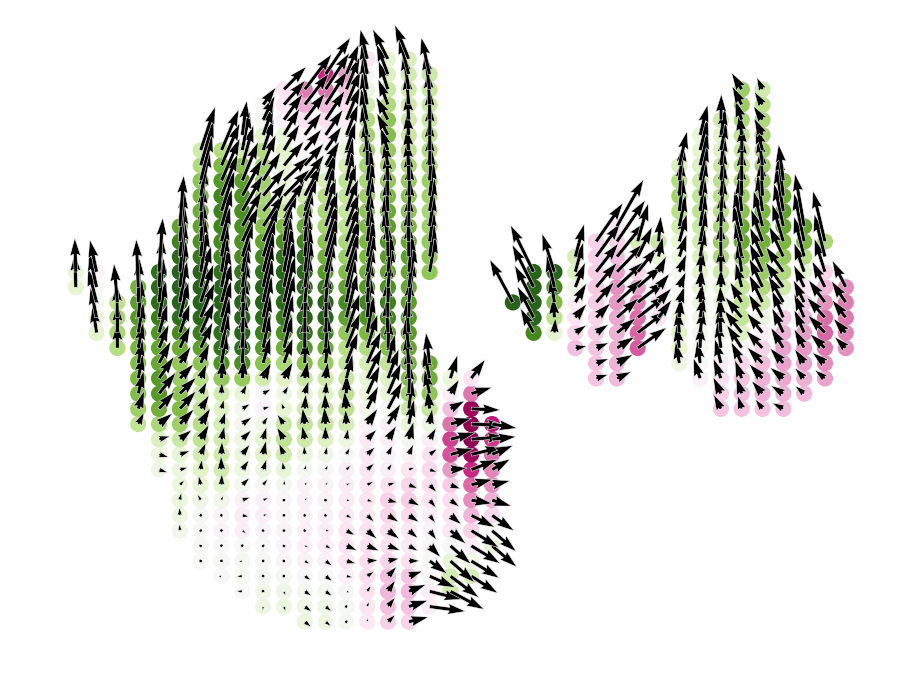

In [46]:
# Show perturbation scores with perturbation simulation vector field
fig, ax = plt.subplots(figsize=[8, 6])
dev.plot_inner_product_on_grid(vm=vm, s=50, ax=ax)
dev.plot_simulation_flow_on_grid(scale=15, show_background=False, ax=ax)

In [47]:
fig.savefig("Fig3_TFregulon_FOSL1_OE_score_woundcell_NEW.pdf", bbox_inches='tight')

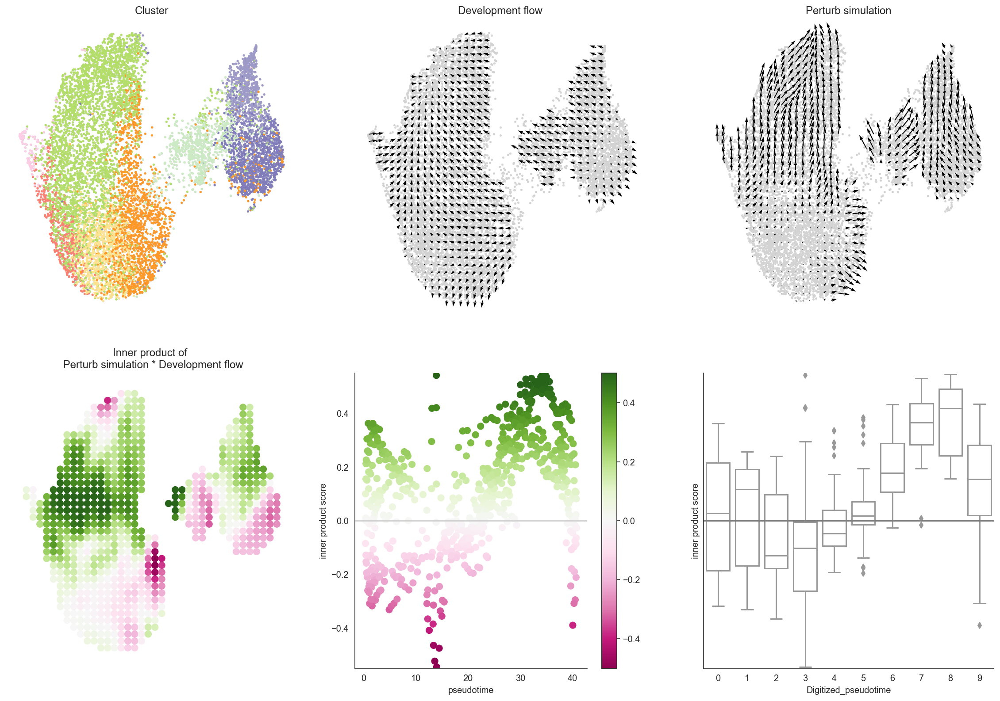

In [48]:
# Let's visualize the results 
dev.visualize_development_module_layout_0(s=5, 
                                          scale_for_simulation=scale_simulation,
                                          s_grid=50,
                                          scale_for_pseudotime=scale_dev, 
                                          vm=vm)

In [46]:
# Get cell index list for the cells of interest
clusters = ['Bas_I', 'Bas_II', 'Bas_III', 'Gra_I', 'Spi_I', 'Spi_II', 'Spi_III', 'Spi_IV', 'Spi_V']
cell_idx = np.where(oracle.adata.obs["CellTypes"].isin(clusters))[0]

# Check index
print(cell_idx)

[    0     1     2 ... 27102 27103 27104]


In [47]:
dev = Oracle_development_module()

# Load development flow
dev.load_differentiation_reference_data(gradient_object=gradient)

# Load simulation result
dev.load_perturb_simulation_data(oracle_object=oracle, 
                                 cell_idx_use=cell_idx, # Enter cell id list
                                 name="Spi_V" # Name of this cell group. You can enter any name.
                                 )

# Calculation
dev.calculate_inner_product()
dev.calculate_digitized_ip(n_bins=10)

In [ ]:
# Let's visualize the results 
dev.visualize_development_module_layout_0(s=5, 
                                          scale_for_simulation=scale_simulation,
                                          s_grid=50,
                                          scale_for_pseudotime=scale_dev, 
                                          vm=vm)

In [49]:
dev = Oracle_development_module()

# Load development flow
dev.load_differentiation_reference_data(gradient_object=gradient)

# Load simulation result
dev.load_perturb_simulation_data(oracle_object=oracle, 
                                 cell_idx_use=cell_idx, # Enter cell id list
                                 name="Bas_III" # Name of this cell group. You can enter any name.
                                 )

# Calculation
dev.calculate_inner_product()
dev.calculate_digitized_ip(n_bins=10)

In [ ]:
# Let's visualize the results 
dev.visualize_development_module_layout_0(s=5, 
                                          scale_for_simulation=scale_simulation,
                                          s_grid=50,
                                          scale_for_pseudotime=scale_dev, 
                                          vm=vm)